In [1]:
import pandas as pd
import numpy as np
import sklearn as sk
import tensorflow as tf
import matplotlib.pyplot as plt
import nibabel as nib
import os
from scipy import stats
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv3D, MaxPooling3D, Flatten, Dense
from tensorflow.keras.optimizers import Adam



2024-04-18 11:39:19.571426: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
#This block for playing with Excel Data
df = pd.read_excel("PTs_500_4k_blinded.xlsx")
df.head()
print(df.info)

del_indices = set() #To keep in track with the deleted values
# Filter out rows with negative values
#This is means that we do have (171-163+1 negative values)
negative_values_filter = (df.iloc[:, 1] < 0) | (df.iloc[:, 2] < 0)
df_filtered = df[~negative_values_filter]
del_indices.update(df[negative_values_filter].index)

#getting red of the outliers
#This is means that we do have 1 outlier
Z_scores = stats.zscore(df_filtered.iloc[:,1])
threshold = 3
outliers_filter = Z_scores >= threshold
df_without_outliers = df_filtered[~outliers_filter]
del_indices.update(df_filtered[outliers_filter].index)
print(df_without_outliers.info)

#Our final preprocessed data is df_without_outliers
# To keep track of the deleted indices, to delete the associated photos as well
print(del_indices)


<bound method DataFrame.info of              ID  PT500  PT4000
0    smwp1_0001   25.0    72.5
1    smwp1_0002    5.0    10.0
2    smwp1_0003    5.0    45.0
3    smwp1_0004    5.0    15.0
4    smwp1_0005    2.5    62.5
..          ...    ...     ...
166  smwp1_0167    0.0    27.5
167  smwp1_0168   37.5     2.5
168  smwp1_0169    7.5    10.0
169  smwp1_0170    0.0    -2.5
170  smwp1_0171   10.0    57.5

[171 rows x 3 columns]>
<bound method DataFrame.info of              ID  PT500  PT4000
0    smwp1_0001   25.0    72.5
1    smwp1_0002    5.0    10.0
2    smwp1_0003    5.0    45.0
3    smwp1_0004    5.0    15.0
4    smwp1_0005    2.5    62.5
..          ...    ...     ...
165  smwp1_0166    2.5     2.5
166  smwp1_0167    0.0    27.5
167  smwp1_0168   37.5     2.5
168  smwp1_0169    7.5    10.0
170  smwp1_0171   10.0    57.5

[162 rows x 3 columns]>
{104, 169, 51, 19, 85, 118, 23, 57, 26}


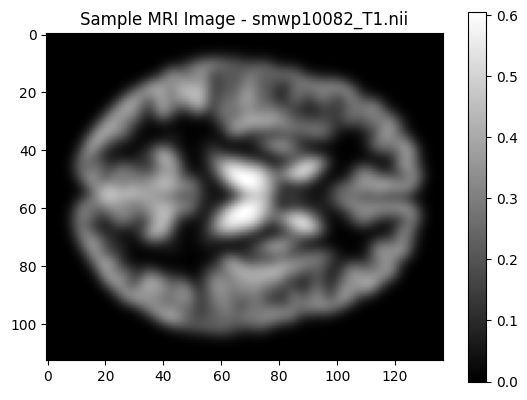

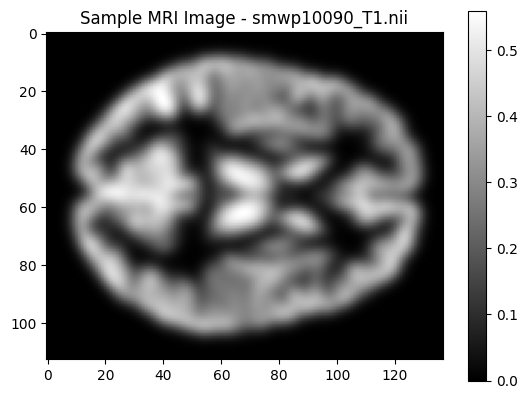

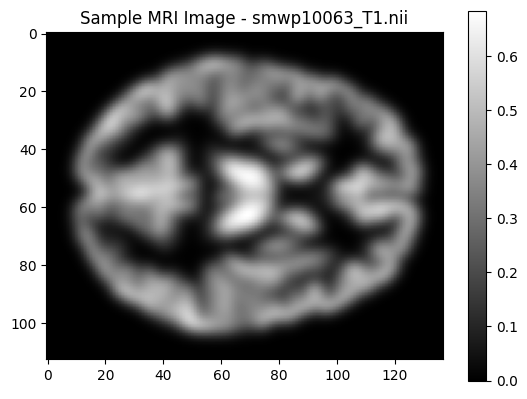

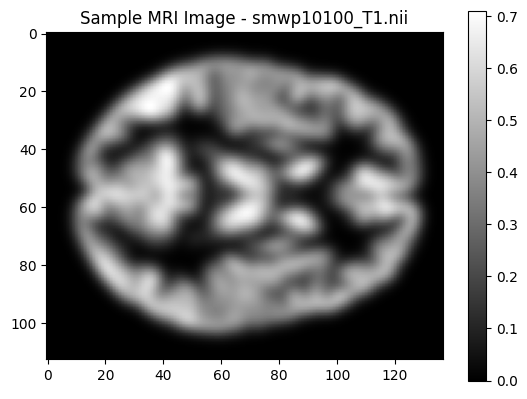

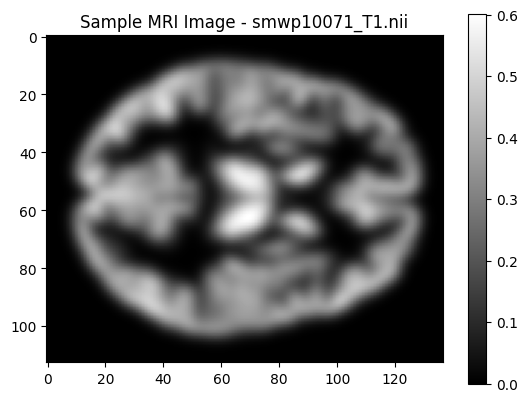

...

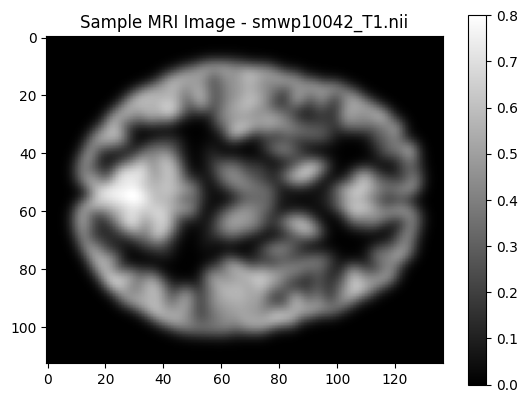

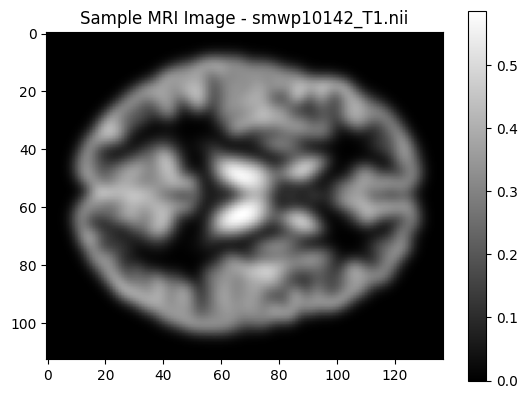

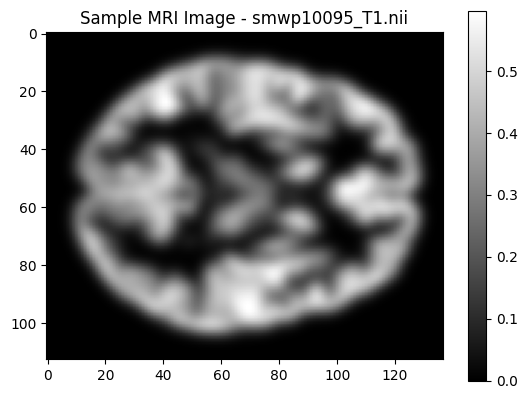

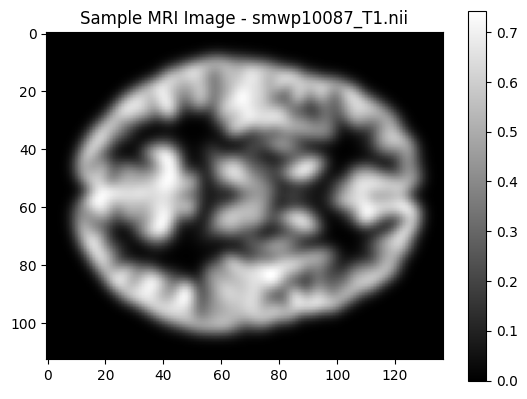

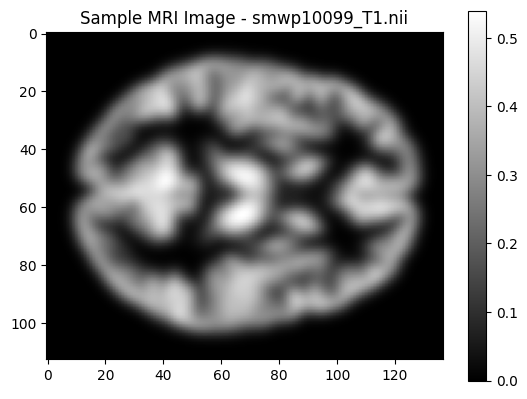

162


In [3]:
#Playing with images, accumulate their data in one matrix
import os
import nibabel as nib

dir = r'/Users/anilchandler/PycharmProjects/LSTM/dataset/n171_smwp1'

nii_data = []

for file in os.listdir(dir):
    if file.endswith('.nii'):
        filepath = os.path.join(dir, file)
        img = nib.load(filepath)
        data = img.get_fdata()
        nii_data.append(data)
        plt.imshow(data[:, :, data.shape[2] // 2], cmap='gray')  # Display a slice from the middle of the image
        plt.title(f'Sample MRI Image - {file}')
        plt.colorbar()
        plt.show()
        
print(len(nii_data))
nii_data_array = np.array(nii_data)

In [4]:
#The shape of our image array
print(nii_data_array.shape)
print(nii_data_array)


(162, 113, 137, 113)
[[[[0. 0. 0. ... 0. 0. 0.]
   [0. 0. 0. ... 0. 0. 0.]
   [0. 0. 0. ... 0. 0. 0.]
   ...
   [0. 0. 0. ... 0. 0. 0.]
   [0. 0. 0. ... 0. 0. 0.]
   [0. 0. 0. ... 0. 0. 0.]]

  [[0. 0. 0. ... 0. 0. 0.]
   [0. 0. 0. ... 0. 0. 0.]
   [0. 0. 0. ... 0. 0. 0.]
   ...
   [0. 0. 0. ... 0. 0. 0.]
   [0. 0. 0. ... 0. 0. 0.]
   [0. 0. 0. ... 0. 0. 0.]]

  [[0. 0. 0. ... 0. 0. 0.]
   [0. 0. 0. ... 0. 0. 0.]
   [0. 0. 0. ... 0. 0. 0.]
   ...
   [0. 0. 0. ... 0. 0. 0.]
   [0. 0. 0. ... 0. 0. 0.]
   [0. 0. 0. ... 0. 0. 0.]]

  ...

  [[0. 0. 0. ... 0. 0. 0.]
   [0. 0. 0. ... 0. 0. 0.]
   [0. 0. 0. ... 0. 0. 0.]
   ...
   [0. 0. 0. ... 0. 0. 0.]
   [0. 0. 0. ... 0. 0. 0.]
   [0. 0. 0. ... 0. 0. 0.]]

  [[0. 0. 0. ... 0. 0. 0.]
   [0. 0. 0. ... 0. 0. 0.]
   [0. 0. 0. ... 0. 0. 0.]
   ...
   [0. 0. 0. ... 0. 0. 0.]
   [0. 0. 0. ... 0. 0. 0.]
   [0. 0. 0. ... 0. 0. 0.]]

  [[0. 0. 0. ... 0. 0. 0.]
   [0. 0. 0. ... 0. 0. 0.]
   [0. 0. 0. ... 0. 0. 0.]
   ...
   [0. 0. 0. ... 0. 0. 0.]
  

In [5]:
for idx, image_data in enumerate(nii_data, start=1):
    print(f"Image {idx}:")
    print(f"Shape: {image_data.shape}")
    print(f"Data type: {image_data.dtype}")
    print(f"Min intensity: {image_data.min()}")
    print(f"Max intensity: {image_data.max()}")
    print()

Image 1:
Shape: (113, 137, 113)
Data type: float64
Min intensity: 0.0
Max intensity: 0.6779096126556396

Image 2:
Shape: (113, 137, 113)
Data type: float64
Min intensity: 0.0
Max intensity: 0.6259483695030212

Image 3:
Shape: (113, 137, 113)
Data type: float64
Min intensity: 0.0
Max intensity: 0.8318760395050049

Image 4:
Shape: (113, 137, 113)
Data type: float64
Min intensity: 0.0
Max intensity: 0.8440548181533813

Image 5:
Shape: (113, 137, 113)
Data type: float64
Min intensity: 0.0
Max intensity: 0.6986436247825623

Image 6:
Shape: (113, 137, 113)
Data type: float64
Min intensity: 0.0
Max intensity: 0.6795271635055542

Image 7:
Shape: (113, 137, 113)
Data type: float64
Min intensity: 0.0
Max intensity: 0.7960553169250488

Image 8:
Shape: (113, 137, 113)
Data type: float64
Min intensity: 0.0
Max intensity: 0.6615241765975952

Image 9:
Shape: (113, 137, 113)
Data type: float64
Min intensity: 0.0
Max intensity: 0.8042222857475281

Image 10:
Shape: (113, 137, 113)
Data type: float64
Min

In [6]:
#Normalize the image data to be between Zero and 1
#before normalization
print(f'Max Before Normalization: {nii_data_array.max()}')
#After Normalization
nii_data_reshaped = nii_data_array.reshape(-1,nii_data_array.shape[-1])
scaler = MinMaxScaler()
nii_data_normalized = scaler.fit_transform(nii_data_reshaped)
nii_data_normalized = nii_data_normalized.reshape(nii_data_array.shape)
print(f'Max After Normalization: {nii_data_normalized.max()}')


Max Before Normalization: 1.1022199392318726
Max After Normalization: 1.0


In [7]:
#Spliting the data into training, validation, and testing sets:
X = nii_data_normalized # Image Data
y = df_without_outliers[['PT500','PT4000']].values #Threeshold Data

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.2, random_state=42)
X_train, X_eval, y_train,y_eval = train_test_split(X,y,test_size=0.1,random_state=42)


In [10]:
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.callbacks import EarlyStopping

try:
    # Load data
    X = nii_data_normalized  # This should be an array with a shape of (num_samples, height, width, channels)
    y = df_without_outliers[['PT500', 'PT4000']].values  # Verify this corresponds directly to the rows in X

    # Basic data integrity check
    if X.shape[0] != y.shape[0]:
        raise ValueError(f"Mismatch in samples: {X.shape[0]} in X vs {y.shape[0]} in y")

    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42)

    # Ensure input data is 3D (num_samples, height, width)
    X_train = X_train[..., 0]  # Assuming the extra dimension is unnecessary and contains grayscale values
    X_val = X_val[..., 0]
    X_test = X_test[..., 0]

    # Define the LSTM model
    model = Sequential()
    model.add(LSTM(64, input_shape=(X_train.shape[1], X_train.shape[2])))
    model.add(Dense(2))
    model.compile(optimizer='adam', loss='mse')

    # Train with early stopping
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    history = model.fit(X_train, y_train, epochs=100, batch_size=64, validation_data=(X_val, y_val), callbacks=[early_stopping])

    # Evaluation
    val_loss = model.evaluate(X_val, y_val)
    test_loss = model.evaluate(X_test, y_test)
    mae = mean_absolute_error(y_test, model.predict(X_test))
    mse = mean_squared_error(y_test, model.predict(X_test))
    
    print(f"Validation Loss: {val_loss}")
    print(f"Test Loss: {test_loss}")
    print(f"Mean Absolute Error: {mae}")
    print(f"Mean Squared Error: {mse}")
    
except Exception as e:
    print(f"Error: {e}")


/Users/anilchandler/PycharmProjects/LSTM/.venv/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 722ms/step - loss: 727.9737 - val_loss: 1429.9077
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 730.2323 - val_loss: 1428.4966
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 685.9924 - val_loss: 1426.5708
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 756.0792 - val_loss: 1423.7142
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 754.4675 - val_loss: 1418.8741
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 716.3016 - val_loss: 1408.3843
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 732.8510 - val_loss: 1367.6431
Epoch 8/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 674.3853 - val_loss: 1270.5105
Epoch 9/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 628.2244 - val_loss: 1209.6959
Epoch 10/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 591.1835 - val_loss: 1169.0262
Epoch 11/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 554.5695 - val_loss: 1141.3967
Epoch 12/100
2/2 